# of nodes: 2716
# of edges: 1692450
# of nodes: 2649
# of edges: 1003858
src centriod: [-118.1528085   34.098628 ], dst centriod: [-118.15508201   34.10732695]
src centriod: [-118.15075124   34.08341963], dst centriod: [-118.15266639   34.09029573]
src centriod: [-118.15266639   34.09029573], dst centriod: [-118.15023891   34.09595766]
src centriod: [-118.14184446   34.08538654], dst centriod: [-118.14162277   34.08013327]
src centriod: [-118.13948648   34.07262509], dst centriod: [-118.12195981   34.07206641]
src centriod: [-118.13948648   34.07262509], dst centriod: [-118.14907131   34.06458611]
src centriod: [-118.11315003   34.08121859], dst centriod: [-118.12195981   34.07206641]
src centriod: [-118.11315003   34.08121859], dst centriod: [-118.10959973   34.06754916]
src centriod: [-118.11315003   34.08121859], dst centriod: [-118.0975576    34.07361118]
The percentage of points satisfying triangle inequality: 90.20
mst_cost=269084.5449999994
tsp_cost=425506.5699999999
upperbound

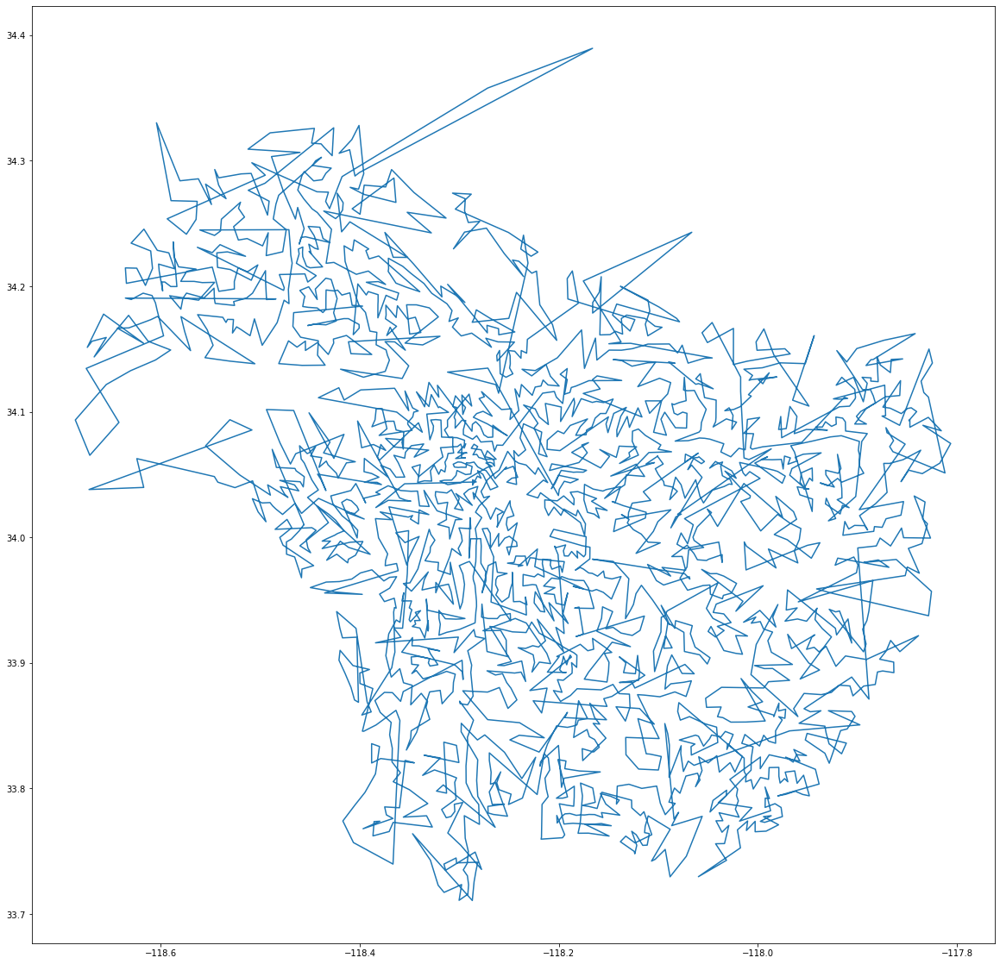

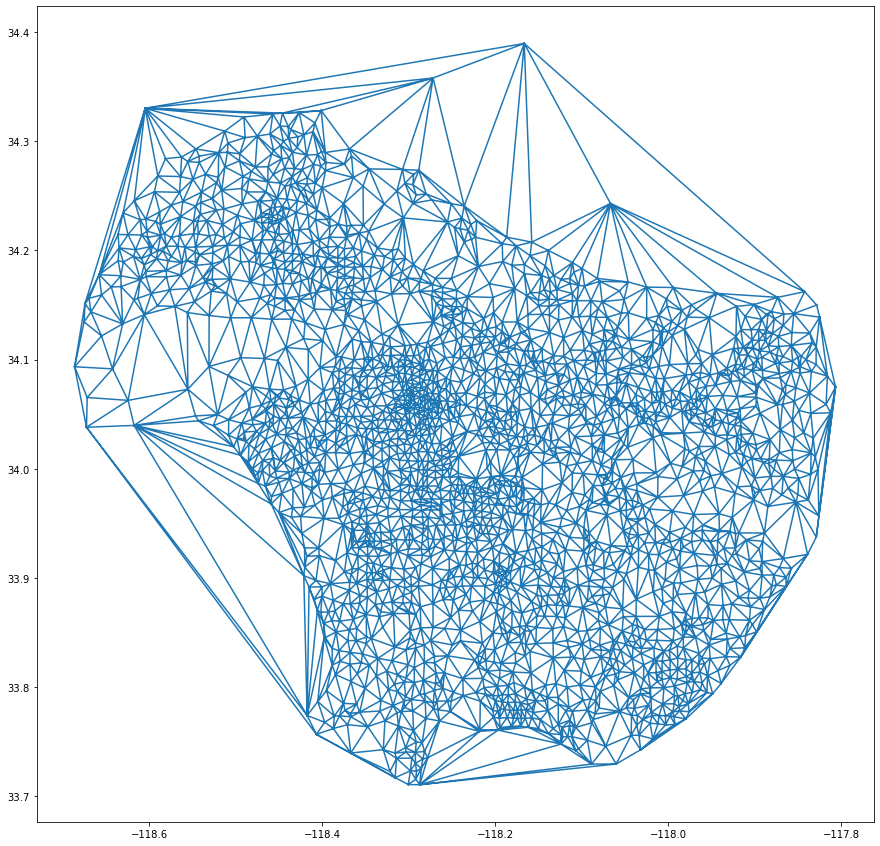

# of edge-disjoint paths: 3
Degree Distribution of nodes (Malibu, Long Beach):  3 5


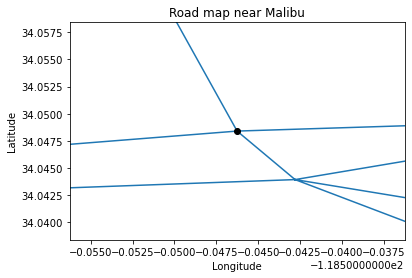

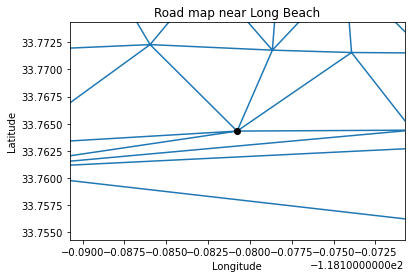

In [3]:
import pandas
import numpy as np
import igraph
import json

# test
with open('los_angeles_censustracts.json') as f:
    census_tracts = json.loads(f.readline())
display_names = dict()
coordinates = dict()

for area in census_tracts['features']:
    id = int(area['properties']['MOVEMENT_ID'])
    display_name = area['properties']['DISPLAY_NAME']
    display_names[id] = display_name
    a = area['geometry']['coordinates'][0]
    coordinates[id] = np.array(a if type(a[0][0]) == float else a[0]).mean(axis=0)

g = igraph.Graph(directed=False)
g.add_vertices(len(display_names))
g.vs['name'] = list(display_names.values())  # index = id - 1
g.vs['coordinate'] = list(coordinates.values())

month_filter = {12}  # for monthly aggregate data of 4th quarter, we can filter data based off of only December

edges = []
weights = []

with open('los_angeles-censustracts-2019-4-All-MonthlyAggregate.csv') as f:
    f.readline()  # skip the first line
    
    while True:
        line = f.readline()
        if line == '':
            break  # end of file
        
        vals = line.strip().split(',')
        
        # read edge info
        src, dest, month, dist = int(vals[0]), int(vals[1]), int(vals[2]), float(vals[3])

        # if data is not relevant, skip it
        if month not in month_filter:
            continue
            
        edges.append((src - 1, dest - 1))
        weights.append(dist)

g.add_edges(edges)
g.es['weight'] = weights
print(f'# of nodes: {len(g.vs)}')
print(f'# of edges: {len(g.es)}')
g = g.simplify(combine_edges=dict(weight='mean'))  # combine duplicate edges
cleanGraph = g.components().giant()
print(f'# of nodes: {len(cleanGraph.vs)}')
print(f'# of edges: {len(cleanGraph.es)}')



mst = cleanGraph.spanning_tree(weights=cleanGraph.es['weight'])
for e in mst.es[10:19]:
  e0, e1 = e.tuple
  #v0 = vertexAttributes[int(float(mst.vs(e0).get_attribute_values('name')[0]))]
  #v1 = vertexAttributes[int(float(mst.vs(e1).get_attribute_values('name')[0]))]
  print('src centriod: {}, dst centriod: {}'.format(mst.vs(e0).get_attribute_values('coordinate')[0], mst.vs(e1).get_attribute_values('coordinate')[0]))
# Q11
samples = list()
while len(samples) < 1000:
  try:
    v1, v2, v3 = np.random.randint(1, len(cleanGraph.vs), 3)
    e1, e2, e3 = cleanGraph.get_eid(v1, v2), cleanGraph.get_eid(v2, v3), cleanGraph.get_eid(v1, v3)
    weights = [cleanGraph.es['weight'][id] for id in [e1, e2, e3]]
    samples.append(weights)
  except: pass
count = 0
for w1, w2, w3 in samples:
  if w1+w2 > w3 and w2+w3 > w1 and w1+w3 > w2:
    count += 1
print(f'The percentage of points satisfying triangle inequality: {count/1000*100:.2f}')
# Q12
# distance matrix for the clean graph
distance = cleanGraph.shortest_paths_dijkstra(source=cleanGraph.vs, target=cleanGraph.vs, weights='weight')
import networkx as nx
import random

mg = nx.MultiGraph()
for e in mst.es:
  v0, v1 = e.tuple
  mg.add_edge(v0, v1, weight=e['weight'])
  mg.add_edge(v0, v1, weight=e['weight'])

startPoints = [v for v in mg.nodes]
startPoints = random.choices(startPoints, k=50)

trajectory = list()
cost = list()
for start in startPoints:
  walk = [u for u,v in nx.eulerian_circuit(mg, source=start)]
  path = list()
  visited = set()
  for node in walk:
    if node not in visited:
      visited.add(node)
      path.append(node)
  path.append(path[0])
  trajectory.append(path)

  dist = 0
  for i in range(len(path)-1):
    n1, n2 = path[i], path[i+1]
    dist += distance[n1][n2]
  cost.append(dist)

mst_cost = sum(mst.es.get_attribute_values('weight'))
tsp_cost = min(cost)
tsp = trajectory[np.argmin(tsp_cost)]
print(f'mst_cost={mst_cost}')
print(f'tsp_cost={tsp_cost}')
print(f'upperbound={tsp_cost/mst_cost:.2f}')
# Q13
import matplotlib.pyplot as plt

tsp_coordinates = np.array(cleanGraph.vs['coordinate'])[tsp, :]
plt.figure(figsize=(20,20))
plt.plot(tsp_coordinates[:, 0], tsp_coordinates[:, 1],'-')
plt.show()
# Q14
from scipy.spatial import Delaunay

coordinates = np.array(cleanGraph.vs['coordinate'])
tri = Delaunay(coordinates)
plt.figure(figsize=(15,15))
plt.triplot(coordinates[:, 0], coordinates[:, 1], tri.simplices.copy())
plt.show()
# G_delta
edges = list()
added = set()
triGraph = igraph.Graph(directed=False)
triGraph.add_vertices(len(tri.points))
triGraph.vs['coordinate'] = cleanGraph.vs['coordinate']
for i in range(tri.simplices.shape[0]):
    for col1, col2 in ((0, 1), (1, 2), (0, 2)):
      e = [tri.simplices[i, col1], tri.simplices[i, col2]]
      e.sort()
      e = tuple(e)
      if e not in added:
        edges.append(e)
        added.add(e)
triGraph.add_edges(edges)

# Q16
malibu = [-118.5670548, 34.0458901]
longBeach = [-118.1819374, 33.759958]
longBeachNode = 0
longBeachDist = np.inf
malibuNode = 0
malibuDist = np.inf
for i, (lat, lon) in enumerate(triGraph.vs['coordinate']):
  ldist = np.sqrt((lat-longBeach[0])**2 + (lon-longBeach[1])**2)
  if ldist < longBeachDist:
    longBeachDist = ldist
    longBeachNode = int(i)
  mdist = np.sqrt((lat-malibu[0])**2 + (lon-malibu[1])**2)
  if mdist < malibuDist:
    malibuDist = mdist
    malibuNode = int(i)

print(f'# of edge-disjoint paths: {triGraph.adhesion(longBeachNode, malibuNode)-1}')
print(f'Degree Distribution of nodes (Malibu, Long Beach): ', triGraph.degree(malibuNode)-1,triGraph.degree(longBeachNode)-1)
lon, lat = triGraph.vs(malibuNode).get_attribute_values('coordinate')[0]
plt.triplot(coordinates[:, 0], coordinates[:, 1], tri.simplices.copy())
plt.ylim(lat-0.01, lat+0.01)
plt.xlim(lon-0.01, lon+0.01)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Road map near Malibu')
plt.plot(lon, lat, 'o',color='black')
plt.show()
lon, lat = triGraph.vs(longBeachNode).get_attribute_values('coordinate')[0]
plt.triplot(coordinates[:, 0], coordinates[:, 1], tri.simplices.copy())
plt.ylim(lat-0.01, lat+0.01)
plt.xlim(lon-0.01, lon+0.01)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Road map near Long Beach')
plt.plot(lon, lat, 'o',color='black')
plt.show()

### Question 17

In [96]:
# G_delta
distance = cleanGraph.shortest_paths_dijkstra(source=cleanGraph.vs, target=cleanGraph.vs, weights='weight')
edges, weights = [], []
added = set()
triGraph = igraph.Graph(directed=False)
triGraph.add_vertices(len(tri.points))
triGraph.vs['coordinate'] = cleanGraph.vs['coordinate']
for i in range(tri.simplices.shape[0]):
    for col1, col2 in ((0, 1), (1, 2), (0, 2)):
      e = [tri.simplices[i, col1], tri.simplices[i, col2]]
      e.sort()
      e = tuple(e)
      if e not in added:
        edges.append(e)
        weights.append(distance[e[0]][e[1]])
        added.add(e)
triGraph.add_edges(edges)
triGraph.es['weight'] = weights
trim_thresh = 800
#triGraph = cleanGraph.subgraph_edges(edges)
# pruning
edges_to_induce = triGraph.es.select(weight_le=trim_thresh)
triGraph_prune = triGraph.subgraph_edges(edges_to_induce)

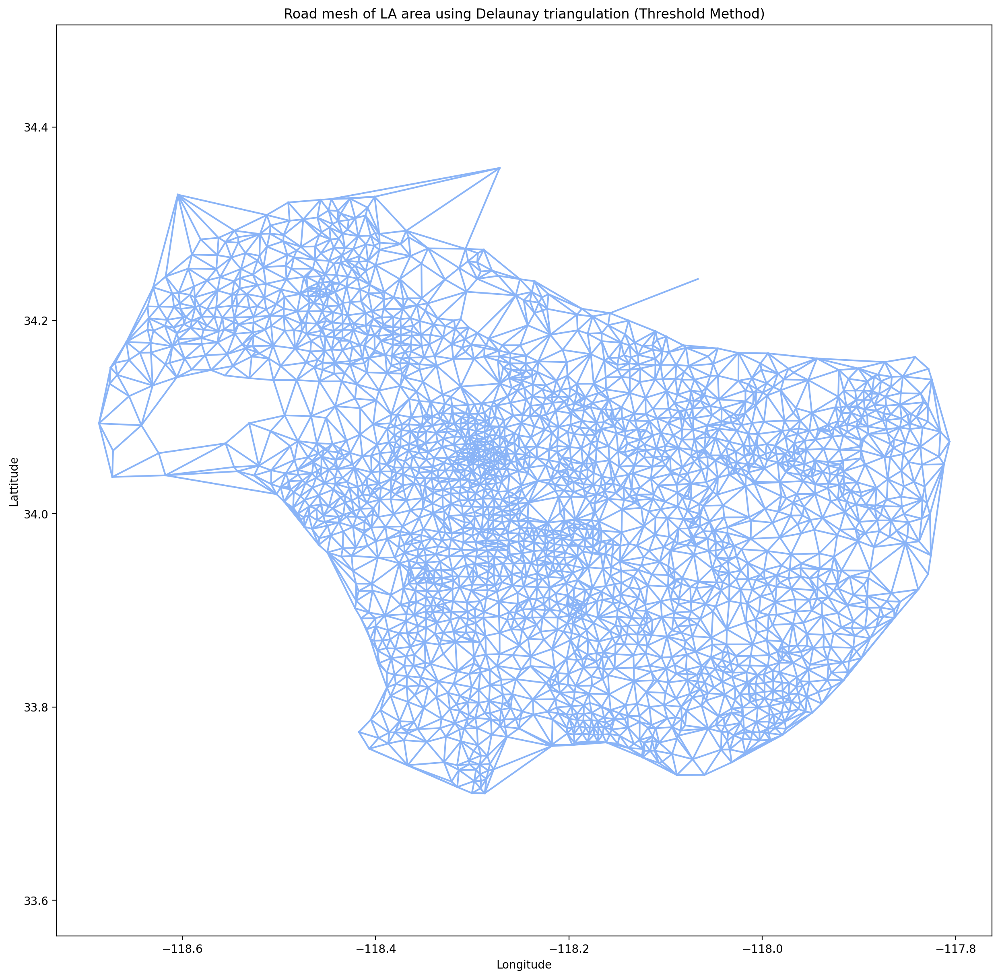

In [97]:
plt.figure(figsize=(15,15), dpi=200)
for e in triGraph_prune.es:
    start = e.source
    end = e.target
    v1 = triGraph_prune.vs['coordinate'][e.source]
    v2 = triGraph_prune.vs['coordinate'][e.target]
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    plt.plot(x, y, '#8ab4f7')
plt.title('Road mesh of LA area using Delaunay triangulation (Threshold Method)')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.axis('equal')
plt.show()

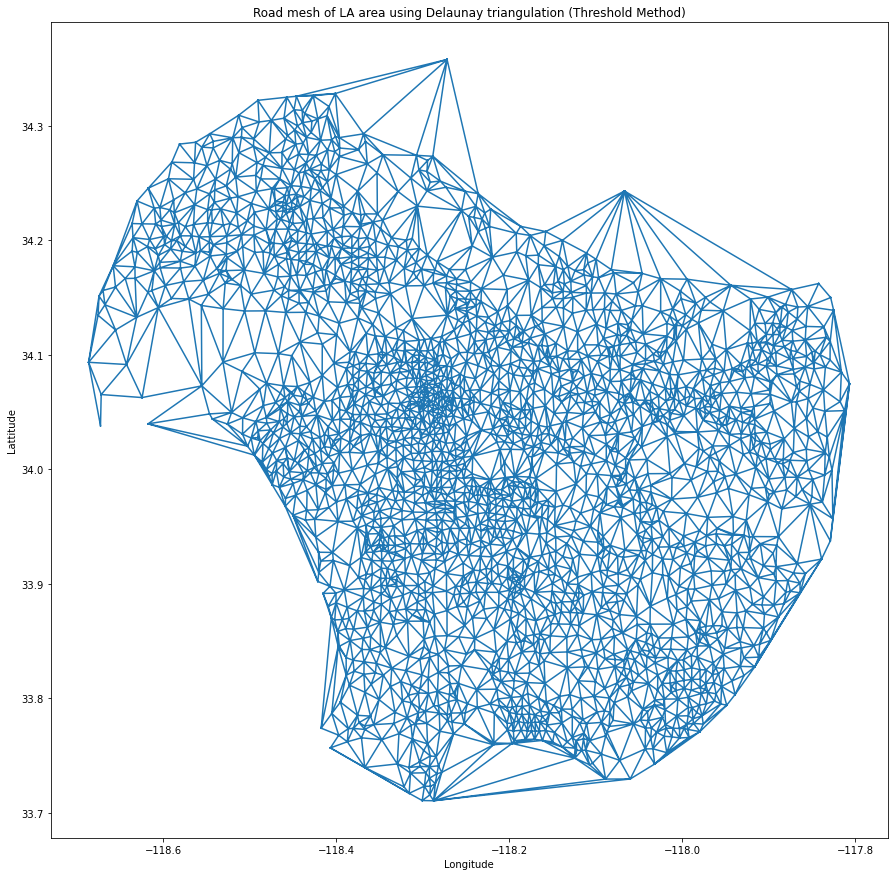

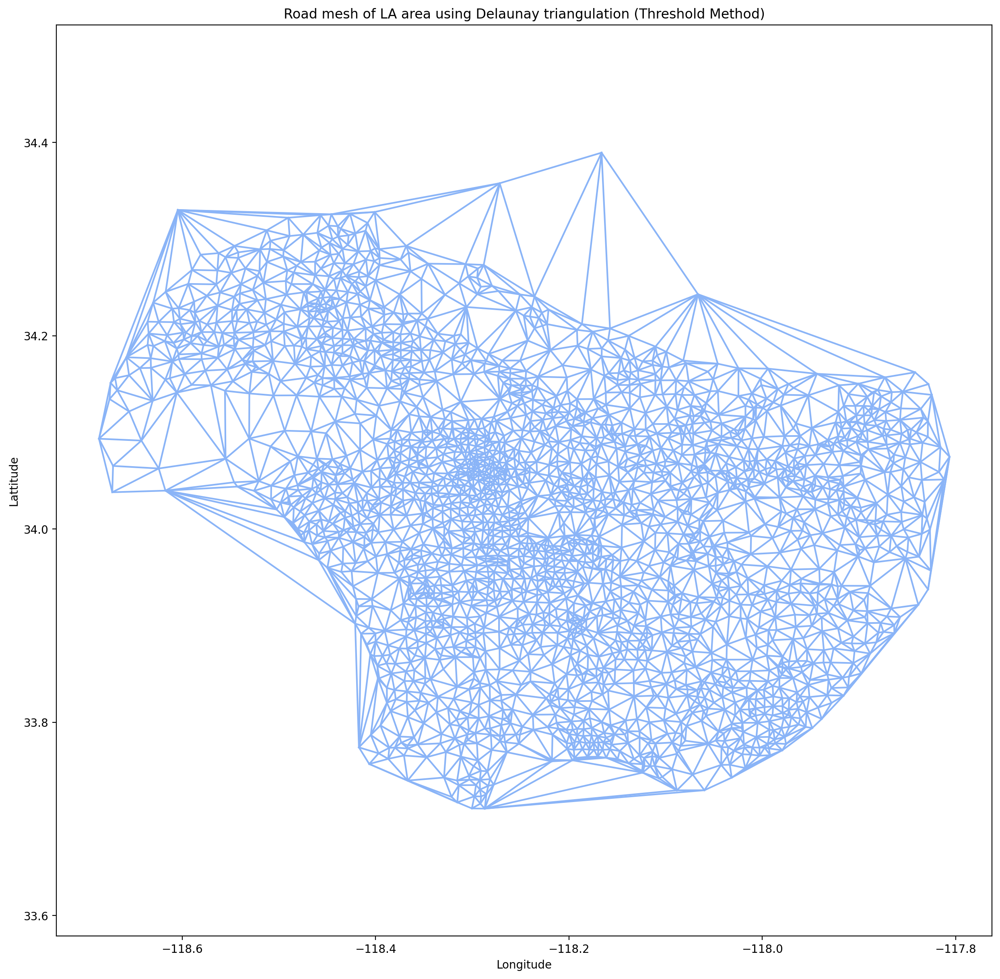

In [84]:
'''
# G_delta_prune
edges = list()
weights = list()
added = set()
threshold = 19.2/69
triGraph_prune = igraph.Graph(directed=False)
triGraph_prune.add_vertices(len(tri.points))
triGraph_prune.vs['coordinate'] = cleanGraph.vs['coordinate']
to_prune_simplices = []
for i in range(tri.simplices.shape[0]):
    three_node = {0,1,2}
    for col1, col2 in ((0, 1), (1, 2), (0, 2)):
      e = [tri.simplices[i, col1], tri.simplices[i, col2]]
      third_node = list(three_node-{col1,col2})
      e.sort()
      e = tuple(e)
      if e not in added:
        added.add(e)
        dist_check = np.linalg.norm(triGraph_prune.vs['coordinate'][e[0]]-triGraph_prune.vs['coordinate'][e[1]]) #np.sqrt((lat1-lat2)**2+(lon1-lon2)**2)
        if dist_check < threshold:
          edges.append(e)
          weights.append(dist_check)
        else:
          to_prune_simplices.append(list(tri.simplices[i]))
        
#print(weights)
triGraph_prune.add_edges(edges)
triGraph_prune.es['weight'] = weights
tri_prune_simplices = [i for i in tri.simplices if i not in np.array(to_prune_simplices)]

plt.figure(figsize=(15,15))
plt.triplot(coordinates[:, 0], coordinates[:, 1], tri_prune_simplices)
plt.title('Road mesh of LA area using Delaunay triangulation (Threshold Method)')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.show()

plt.figure(figsize=(15,15), dpi=200)
for e in triGraph_prune.es:
    start = e.source
    end = e.target
    v1 = triGraph_prune.vs['coordinate'][e.source]
    v2 = triGraph_prune.vs['coordinate'][e.target]
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    plt.plot(x, y, '#8ab4f7')
plt.axis('equal')
plt.title('Road mesh of LA area using Delaunay triangulation (Threshold Method)')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.show()
'''

### Question 18

# of edge-disjoint paths: 3
Degree Distribution of nodes (Malibu, Long Beach):  3 5


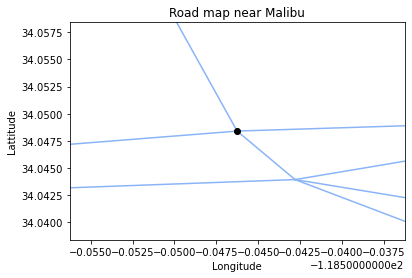

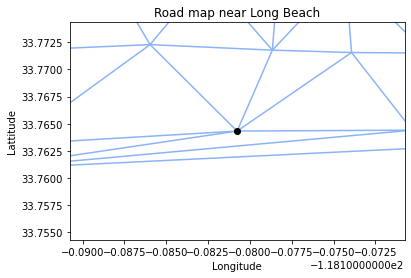

In [128]:
# repeat q16 with triGraph_prune
malibu = [-118.5670548, 34.0458901]
longBeach = [-118.1819374, 33.759958]
longBeachNode = 0
longBeachDist = np.inf
malibuNode = 0
malibuDist = np.inf
for i, (lon, lat) in enumerate(triGraph.vs['coordinate']):
  ldist = np.sqrt((lat-longBeach[1])**2 + (lon-longBeach[0])**2)
  if ldist < longBeachDist:
    longBeachDist = ldist
    longBeachNode = int(i)
  mdist = np.sqrt((lat-malibu[1])**2 + (lon-malibu[0])**2)
  if mdist < malibuDist:
    malibuDist = mdist
    malibuNode = int(i)
print(f'# of edge-disjoint paths: {triGraph_prune.adhesion(longBeachNode, malibuNode)-1}')
print(f'Degree Distribution of nodes (Malibu, Long Beach): ', triGraph_prune.degree(malibuNode)-1,triGraph_prune.degree(longBeachNode)-1)
lon, lat = triGraph_prune.vs(malibuNode).get_attribute_values('coordinate')[0]
for e in triGraph_prune.es:
    start = e.source
    end = e.target
    v1 = triGraph_prune.vs['coordinate'][e.source]
    v2 = triGraph_prune.vs['coordinate'][e.target]
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    plt.plot(x, y, '#8ab4f7')
plt.plot(lon, lat, 'o',color='black')
plt.ylim(lat-0.01, lat+0.01)
plt.xlim(lon-0.01, lon+0.01)
plt.title('Road map near Malibu')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.show()

lon, lat = triGraph_prune.vs(longBeachNode).get_attribute_values('coordinate')[0]
for e in triGraph_prune.es:
    start = e.source
    end = e.target
    v1 = triGraph_prune.vs['coordinate'][e.source]
    v2 = triGraph_prune.vs['coordinate'][e.target]
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    plt.plot(x, y, '#8ab4f7')
plt.plot(lon, lat, 'o',color='black')
plt.ylim(lat-0.01, lat+0.01)
plt.xlim(lon-0.01, lon+0.01)
plt.title('Road map near Long Beach')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.show()

### Question 19

In [113]:
# add edge attribute 'geo_distance' to pruned triGraph
from itertools import combinations
edge_ends = np.array([[e.source, e.target] for e in triGraph_prune.es])
sources, targets = edge_ends[:, 0], edge_ends[:, 1]
coordinates = np.array(triGraph_prune.vs['coordinate'])
geo_distances = np.linalg.norm(coordinates[sources]-coordinates[targets])
triGraph_prune.es['geo_distance'] = geo_distances
def compute_extra_distances(triGraph_prune):
    dist_shortest_path = triGraph_prune.shortest_paths_dijkstra(source=triGraph_prune.vs, target=triGraph_prune.vs, weights='geo_distance')
    vs_pairs = list(combinations(range(len(dist_shortest_path)), 2))
    extra_distances = []
    extra_dist_edges = []
    for v, s in vs_pairs:
        euc_dist = np.linalg.norm(triGraph_prune.vs['coordinate'][v]-triGraph_prune.vs['coordinate'][s])
        extra_distances.append(dist_shortest_path[v][s]-euc_dist)
        extra_dist_edges.append((v,s))
    return np.array(extra_dist_edges), np.array(extra_distances)

In [114]:
# strategy 1
import copy
road_map_static = copy.deepcopy(triGraph_prune)
extra_dist_edges, extra_distances = compute_extra_distances(road_map_static)
top_20_edges = extra_dist_edges[np.argsort(extra_distances)[-20:]]
print(len(top_20_edges))
for v, s in top_20_edges:
    dist = np.linalg.norm(triGraph_prune.vs['coordinate'][v]-triGraph_prune.vs['coordinate'][s])
    road_map_static.add_edge(v, s, geo_distance = dist, weight = -1)
    print('src centriod: {}, dst centriod: {}'.format(road_map_static.vs['coordinate'][v], road_map_static.vs['coordinate'][s]))
'''    
plt.figure(figsize=(15,15))
plt.triplot(coordinates[:, 0], coordinates[:, 1], tri_prune_simplices)
for v, s in top_20_edges:
    x = [triGraph_prune.vs['coordinate'][v][0], triGraph_prune.vs['coordinate'][s][0]]
    y = [triGraph_prune.vs['coordinate'][v][1], triGraph_prune.vs['coordinate'][s][1]]
    plt.plot(x, y, linestyle='-', color='red',markerfacecolor='red', marker='o') 
plt.title('Road mesh with 20 new roads created by strategy1')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.show()
'''

20
src centriod: [-118.00345395   33.89792484], dst centriod: [-118.52616409   34.19778845]
src centriod: [-118.54659469   34.19843531], dst centriod: [-118.00668853   33.93163383]
src centriod: [-118.5268941    34.18775923], dst centriod: [-117.98533402   33.92457221]
src centriod: [-118.53298486   34.17360195], dst centriod: [-117.98533402   33.92457221]
src centriod: [-117.99003283   33.91767665], dst centriod: [-118.5268941    34.18775923]
src centriod: [-117.99003283   33.91767665], dst centriod: [-118.53298486   34.17360195]
src centriod: [-118.54616731   34.18953262], dst centriod: [-118.00214981   33.93649956]
src centriod: [-118.01552637   33.9069158 ], dst centriod: [-118.53024567   34.2132875 ]
src centriod: [-117.99003283   33.91767665], dst centriod: [-118.52598428   34.18469003]
src centriod: [-118.54616731   34.18953262], dst centriod: [-118.00668853   33.93163383]
src centriod: [-118.54173169   34.19594069], dst centriod: [-118.00668853   33.93163383]
src centriod: [-11

"    \nplt.figure(figsize=(15,15))\nplt.triplot(coordinates[:, 0], coordinates[:, 1], tri_prune_simplices)\nfor v, s in top_20_edges:\n    x = [triGraph_prune.vs['coordinate'][v][0], triGraph_prune.vs['coordinate'][s][0]]\n    y = [triGraph_prune.vs['coordinate'][v][1], triGraph_prune.vs['coordinate'][s][1]]\n    plt.plot(x, y, linestyle='-', color='red',markerfacecolor='red', marker='o') \nplt.title('Road mesh with 20 new roads created by strategy1')\nplt.xlabel('Longitude')\nplt.ylabel('Lattitude')\nplt.show()\n"

{540, 943}
{944, 2290}
{946, 2292}
{994, 2292}
{537, 946}
{537, 994}
{945, 2122}
{933, 543}
{537, 947}
{945, 2290}
{929, 2290}
{536, 943}
{537, 991}
{946, 2291}
{994, 2291}
{2124, 998}
{537, 939}
{2292, 998}
{537, 998}
{2291, 998}


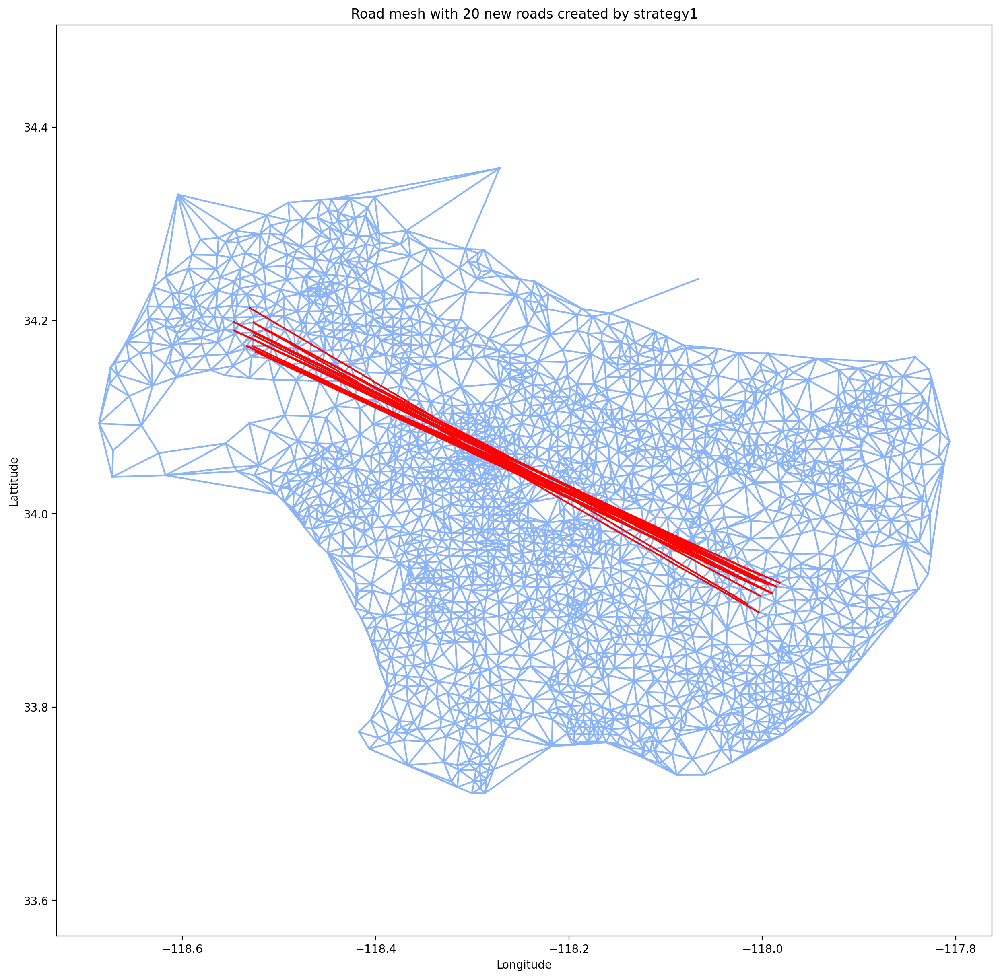

In [115]:
# plot the roads and highlight our new edges. 
new_edges_static = [set(v) for v in top_20_edges]
plt.figure(figsize=(15,15), dpi=200)
for e in road_map_static.es:
    start = e.source
    end = e.target
    cur_edge = {start,end}

    v1 = road_map_static.vs['coordinate'][e.source]
    v2 = road_map_static.vs['coordinate'][e.target]
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if cur_edge in new_edges_static:
        print(cur_edge)
        plt.plot(x,y,'#FF0000') 
    else:
        plt.plot(x, y, '#8ab4f7')
plt.axis('equal')
plt.title('Road mesh with 20 new roads created by strategy1')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.show()

In [127]:
print('triGraph_prune # of edges:', len(triGraph_prune.es))
print('triGraph_prune # of nodes:', len(triGraph_prune.vs))

triGraph_prune # of edges: 7864
triGraph_prune # of nodes: 2648


### Question 20

In [116]:
# strategy 2
frequencies = np.array([random.randint(1, 1000) for i in range(len(extra_distances))])
weighted_extra_distances = frequencies*extra_distances
top_20_edges = extra_dist_edges[np.argsort(weighted_extra_distances)[-20:]]
road_map_static_freq = copy.deepcopy(triGraph_prune)
for v, s in top_20_edges:
    dist = np.linalg.norm(triGraph_prune.vs['coordinate'][v]-triGraph_prune.vs['coordinate'][s])
    road_map_static_freq.add_edge(v, s, geo_distance = dist, weight = -1)
    print('src centriod: {}, dst centriod: {}'.format(triGraph_prune.vs['coordinate'][v], triGraph_prune.vs['coordinate'][s]))


src centriod: [-117.99003283   33.91767665], dst centriod: [-118.47174181   34.1564921 ]
src centriod: [-118.53458408   34.17115052], dst centriod: [-117.9511398    33.93321937]
src centriod: [-118.5091551   34.2047668], dst centriod: [-117.96624395   33.91143109]
src centriod: [-118.07898364   33.83859244], dst centriod: [-118.51333433   34.23795747]
src centriod: [-118.52805092   34.1627222 ], dst centriod: [-117.9511398    33.93321937]
src centriod: [-118.52622609   34.20375545], dst centriod: [-118.03399398   33.92579455]
src centriod: [-118.57425262   34.19449376], dst centriod: [-118.0223558   33.9217662]
src centriod: [-118.54543844   34.18629978], dst centriod: [-118.0221841    33.94117222]
src centriod: [-118.54616731   34.18953262], dst centriod: [-118.0221841    33.94117222]
src centriod: [-118.01552637   33.9069158 ], dst centriod: [-118.58007131   34.20386981]
src centriod: [-118.01050532   33.92139138], dst centriod: [-118.523906     34.16763733]
src centriod: [-118.52689

{537, 1013}
{2569, 995}
{938, 2581}
{516, 783}
{2569, 997}
{937, 2284}
{968, 2285}
{2288, 949}
{2288, 945}
{966, 543}
{998, 535}
{946, 2581}
{937, 543}
{953, 543}
{2492, 903}
{938, 2541}
{945, 2122}
{2291, 998}
{537, 947}
{933, 543}


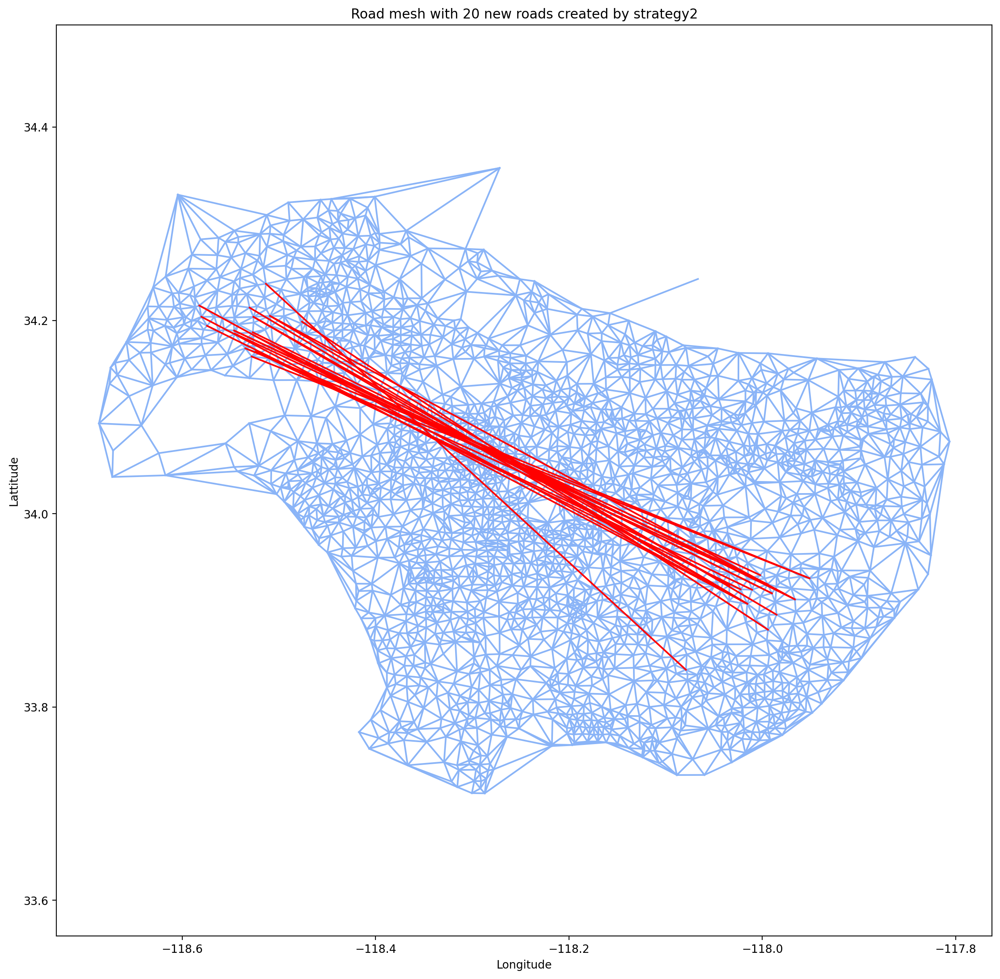

In [117]:
new_edges_static = [set(v) for v in top_20_edges]
plt.figure(figsize=(15,15), dpi=200)
for e in road_map_static_freq.es:
    start = e.source
    end = e.target
    cur_edge = {start,end}
    v1 = road_map_static_freq.vs['coordinate'][e.source]
    v2 = road_map_static_freq.vs['coordinate'][e.target]
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if cur_edge in new_edges_static:
        print(cur_edge)
        plt.plot(x,y,'#FF0000') 
    else:
        plt.plot(x, y, '#8ab4f7')
plt.axis('equal')
plt.title('Road mesh with 20 new roads created by strategy2')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.show()

### Question 21

In [120]:
# strategy 3
road_map_dynamic = copy.deepcopy(triGraph_prune)
new_edges_dynamic = []
for i in range(20):
    extra_dist_edges, extra_distances = compute_extra_distances(road_map_dynamic)
    v,s = extra_dist_edges[np.argmax(extra_distances)]
    euc_dist = np.linalg.norm(road_map_dynamic.vs['coordinate'][v]-road_map_dynamic.vs['coordinate'][s])
    road_map_dynamic.add_edge(v, s, geo_distance = euc_dist, weight = -1)
    new_edges_dynamic.append({v,s})
    print('src centriod: {}, dst centriod: {}'.format(road_map_dynamic.vs['coordinate'][v], road_map_dynamic.vs['coordinate'][s]))

src centriod: [-118.523906     34.16763733], dst centriod: [-117.99439132   33.9270533 ]
src centriod: [-117.90980337   34.11060031], dst centriod: [-118.3450358    33.93371127]
src centriod: [-118.36653713   34.22304028], dst centriod: [-118.2669756   33.7872312]
src centriod: [-118.29370687   34.04999987], dst centriod: [-117.97772759   33.80432696]
src centriod: [-118.14237141   34.06371094], dst centriod: [-118.46111791   34.00506591]
src centriod: [-118.54055746   34.23311195], dst centriod: [-118.24681111   33.97212111]
src centriod: [-118.30335228   33.74463185], dst centriod: [-118.02783257   34.04611905]
src centriod: [-118.13598535   34.16189062], dst centriod: [-118.03280287   33.84540767]
src centriod: [-118.19460307   33.98065181], dst centriod: [-117.8287982    34.09556641]
src centriod: [-118.30533567   34.09571822], dst centriod: [-117.91658202   34.05489235]
src centriod: [-118.38242856   34.06381898], dst centriod: [-118.18665733   33.89556972]
src centriod: [-118.266

{2291, 998}
{54, 494}
{833, 1635}
{2642, 1295}
{19, 1580}
{2337, 787}
{1648, 1973}
{2588, 1814}
{1904, 76}
{2069, 1103}
{1786, 115}
{1241, 2037}
{1184, 644}
{1344, 726}
{2490, 326}
{805, 31}
{1334, 303}
{960, 2421}
{634, 2162}
{722, 2468}


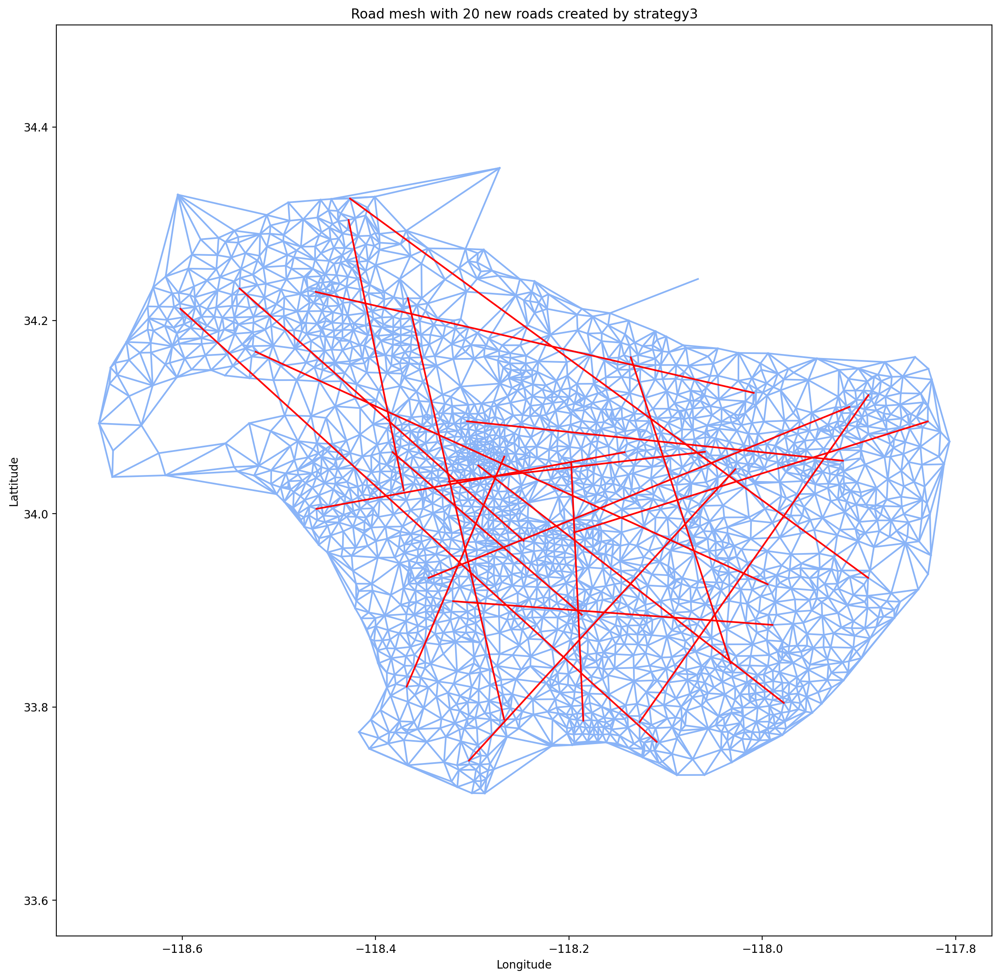

In [121]:
plt.figure(figsize=(15,15), dpi=200)
for e in road_map_dynamic.es:
    start = e.source
    end = e.target
    cur_edge = {start,end}
    v1 = road_map_dynamic.vs['coordinate'][e.source]
    v2 = road_map_dynamic.vs['coordinate'][e.target]
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if cur_edge in new_edges_dynamic:
        print(cur_edge)
        plt.plot(x,y,'#FF0000') 
    else:
        plt.plot(x, y, '#8ab4f7')
plt.axis('equal')
plt.title('Road mesh with 20 new roads created by strategy3')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.show()

In [124]:
# strategy 4
def compute_extra_times(triGraph_prune):
    travel_time_shortest_path = triGraph_prune.shortest_paths_dijkstra(source=triGraph_prune.vs, target=triGraph_prune.vs, weights='weight')
    dist_shortest_path = triGraph_prune.shortest_paths_dijkstra(source=triGraph_prune.vs, target=triGraph_prune.vs, weights='geo_distance')
    vs_pairs = list(combinations(range(len(dist_shortest_path)), 2))
    extra_times, extra_time_edges = [], []
    straight_line_travel_times = []
    for v, s in vs_pairs:
        euc_dist = np.linalg.norm(triGraph_prune.vs['coordinate'][v]-triGraph_prune.vs['coordinate'][s])
        travel_speed = dist_shortest_path[v][s]/travel_time_shortest_path[v][s]
        straight_line_travel_times.append(euc_dist/travel_speed)
        extra_times.append(travel_time_shortest_path[v][s]-euc_dist/travel_speed)
        extra_time_edges.append((v,s))
    return np.array(extra_time_edges), np.array(extra_times), np.array(straight_line_travel_times)

src centriod: [-117.84297474   34.03292298], dst centriod: [-118.67145512   34.06533878]
src centriod: [-117.82866074   34.11170721], dst centriod: [-118.67145512   34.06533878]
src centriod: [-118.67506015   34.13454434], dst centriod: [-117.8348265   34.0507507]
src centriod: [-117.8171969    34.05909112], dst centriod: [-118.68599469   34.0934755 ]
src centriod: [-117.84729842   34.08769754], dst centriod: [-118.67145512   34.06533878]
src centriod: [-118.67506015   34.13454434], dst centriod: [-117.8171969    34.05909112]
src centriod: [-117.80629425   34.07475392], dst centriod: [-118.66929281   34.15616301]
src centriod: [-117.80629425   34.07475392], dst centriod: [-118.68599469   34.0934755 ]
src centriod: [-117.83421479   34.08923539], dst centriod: [-118.66929281   34.15616301]
src centriod: [-118.67506015   34.13454434], dst centriod: [-117.80629425   34.07475392]
src centriod: [-117.83421479   34.08923539], dst centriod: [-118.68599469   34.0934755 ]
src centriod: [-117.848

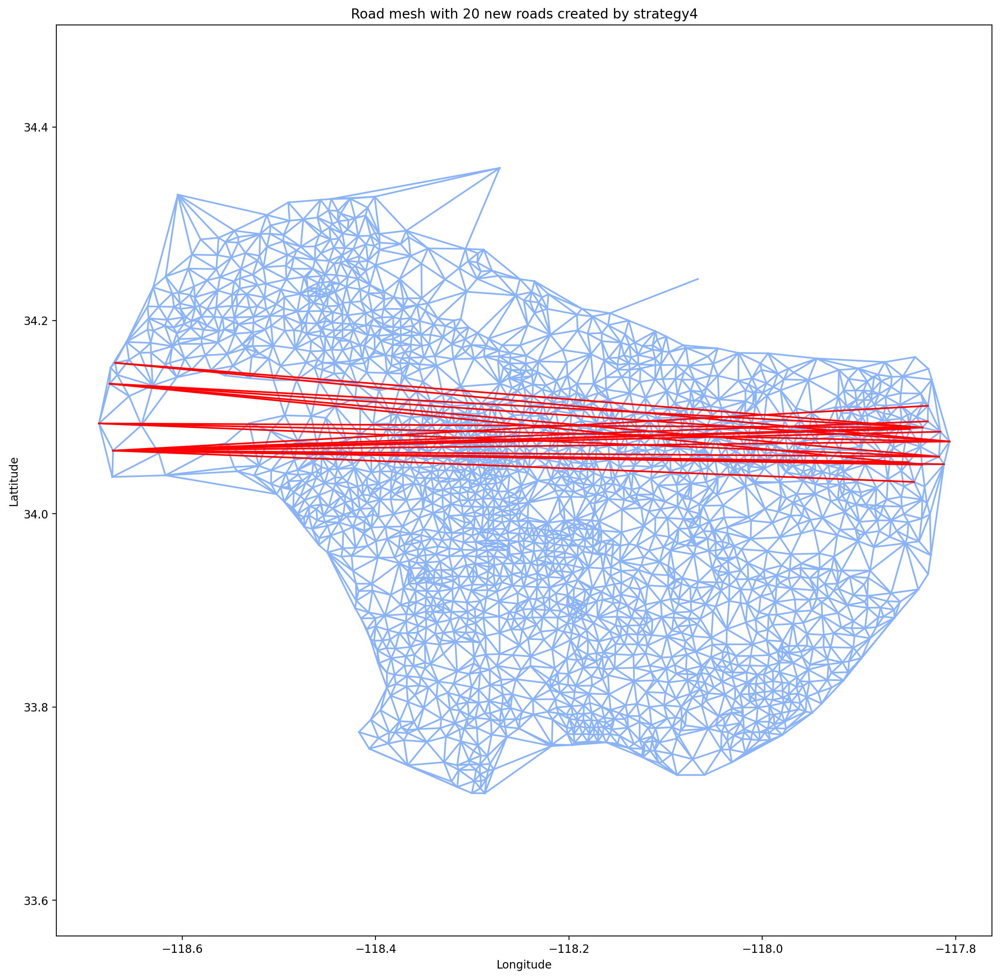

In [125]:
road_map_time_static = copy.deepcopy(triGraph_prune)
extra_time_edges, extra_times, _ = compute_extra_times(road_map_time_static)
top_20_edges = extra_time_edges[np.argsort(extra_times)[-20:]]
for v, s in top_20_edges:
    dist = np.linalg.norm(triGraph_prune.vs['coordinate'][v]-triGraph_prune.vs['coordinate'][s])
    road_map_time_static.add_edge(v, s, geo_distance = dist, weight = -1)
    print('src centriod: {}, dst centriod: {}'.format(road_map_time_static.vs['coordinate'][v], road_map_time_static.vs['coordinate'][s]))
new_edges_time_static = [set(v) for v in top_20_edges]
plt.figure(figsize=(15,15), dpi=200)
for e in road_map_time_static.es:
    start = e.source
    end = e.target
    cur_edge = {start,end}

    v1 = road_map_time_static.vs['coordinate'][e.source]
    v2 = road_map_time_static.vs['coordinate'][e.target]
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if cur_edge in new_edges_time_static:
        print(cur_edge)
        plt.plot(x,y,'#FF0000') 
    else:
        plt.plot(x, y, '#8ab4f7')
plt.axis('equal')
plt.title('Road mesh with 20 new roads created by strategy4')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.show()

### Question 22

src centriod: [-117.83421479   34.08923539], dst centriod: [-118.67145512   34.06533878]
src centriod: [-117.88644509   34.14146265], dst centriod: [-118.39683944   33.7679271 ]
src centriod: [-118.43605667   34.31070678], dst centriod: [-117.98732033   33.78225888]
src centriod: [-118.19451017   33.98522552], dst centriod: [-118.63568514   34.21459065]
src centriod: [-118.38159067   34.20368656], dst centriod: [-118.41714115   33.77410311]
src centriod: [-118.35494326   34.04800626], dst centriod: [-117.863572     33.90063621]
src centriod: [-118.6172417    34.03975775], dst centriod: [-118.0664765    34.24297495]
src centriod: [-118.17393052   33.77154948], dst centriod: [-118.0992941    34.18338864]
src centriod: [-118.04825532   34.07820174], dst centriod: [-118.45828017   33.97470817]
src centriod: [-118.35931311   33.81249902], dst centriod: [-117.99809211   33.94183132]
src centriod: [-118.16416167   33.85646965], dst centriod: [-118.41946311   34.13391466]
src centriod: [-117.9

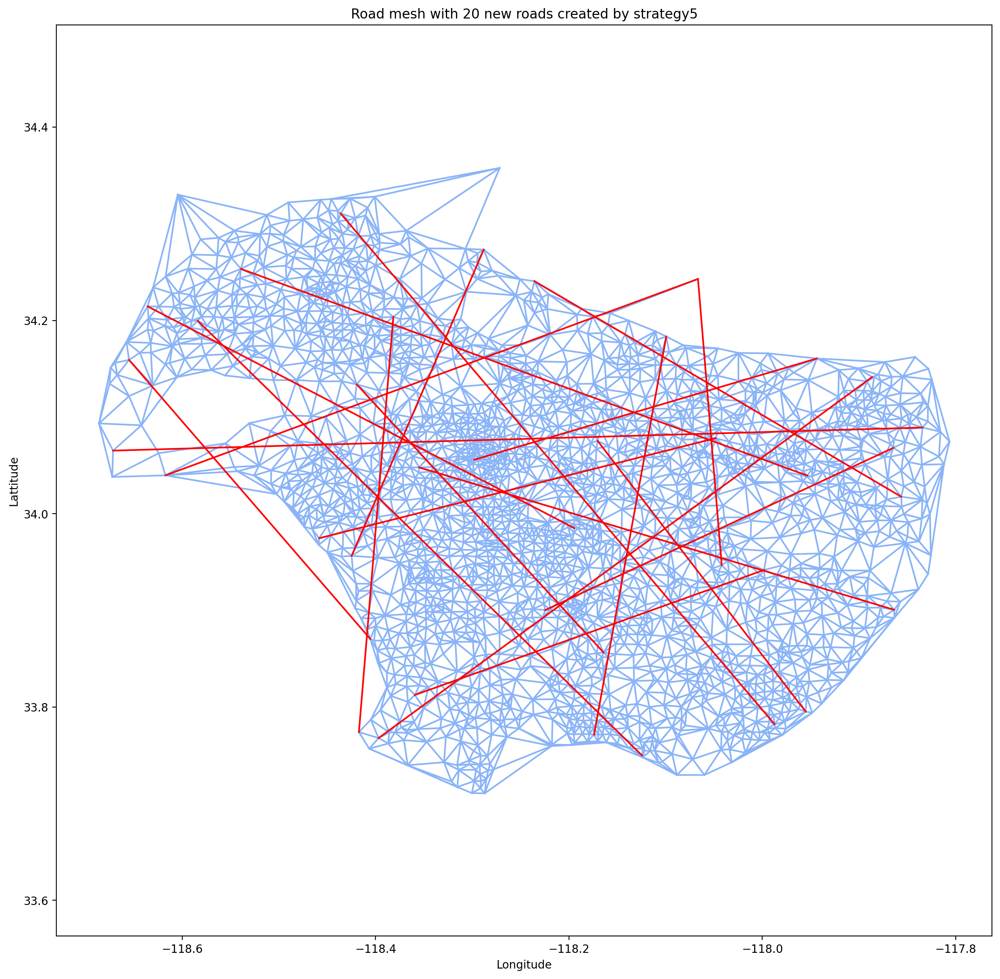

In [126]:
# strategy 5
road_map_time_dynamic = copy.deepcopy(triGraph_prune)
new_edges_time_dynamic = []
for i in range(20):
    extra_time_edges, extra_times, straight_line_travel_times = compute_extra_times(road_map_time_dynamic)
    idx = np.argmax(extra_times)
    v,s = extra_time_edges[idx]
    euc_dist = np.linalg.norm(road_map_time_dynamic.vs['coordinate'][v]-road_map_time_dynamic.vs['coordinate'][s])
    road_map_time_dynamic.add_edge(v, s, geo_distance = euc_dist, weight = straight_line_travel_times[idx])
    new_edges_time_dynamic.append({v,s})
    print('src centriod: {}, dst centriod: {}'.format(road_map_dynamic.vs['coordinate'][v], road_map_dynamic.vs['coordinate'][s]))
plt.figure(figsize=(15,15), dpi=200)
for e in road_map_time_dynamic.es:
    start = e.source
    end = e.target
    cur_edge = {start,end}

    v1 = road_map_time_dynamic.vs['coordinate'][e.source]
    v2 = road_map_time_dynamic.vs['coordinate'][e.target]
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    if cur_edge in new_edges_time_dynamic:
        print(cur_edge)
        plt.plot(x,y,'#FF0000') 
    else:
        plt.plot(x, y, '#8ab4f7')
plt.axis('equal')
plt.title('Road mesh with 20 new roads created by strategy5')
plt.xlabel('Longitude')
plt.ylabel('Lattitude')
plt.show()